## Decision Tree  
* Build a decision tree by taking as input a maximum depth and by randomly splitting the dataset as 80/20 split i.e., 80% for training and 20% for testing. Provide the accuracy by averaging over 10 random 80/20 splits. Consider that particular tree which provides the best test accuracy as the desired one.
* What is the best possible depth limit to be used for your dataset. Provide a plot explaining the same
* Perform the pruning operation over the tree obtained in question 2 using a valid statistical test for comparison.
* Print the final decision tree obtained from question 3 following the hierarchical levels of data attributes as nodes of the tree.
* A brief report explaining the procedure and the results.

* Dataset : https://archive.ics.uci.edu/ml/datasets/Census+Income 

### Importing libraries and reading dataset

In [22]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sklearn
import sklearn.tree
from sklearn.model_selection import train_test_split

In [3]:
data=pd.read_csv('dataset/adult.data')
data.shape
data.head()

,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K


In [4]:
#data.drop(data.columns[11],axis=1,inplace=True)
features=['age','workclass','fnwgt','education','education-num','marital-status','occupation','relationship','race','sex','capital-gain','capital-loss','hours-per-week','native-country','y']

In [5]:
data.columns=['age','workclass','fnwgt','education','education-num','marital-status','occupation','relationship','race','sex','capital-gain','capital-loss','hours-per-week','native-country','y']

In [6]:
data.tail()

,age,workclass,fnwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,y
32555,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32556,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32557,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32558,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K
32559,52,Self-emp-inc,287927,HS-grad,9,Married-civ-spouse,Exec-managerial,Wife,White,Female,15024,0,40,United-States,>50K


In [7]:
data.shape

(32560, 15)

In [8]:
# Remove invalid data from table
data = data[(data.astype(str) != ' ?').all(axis=1)]
len(data) # 30162

30161

In [9]:
# Create a new income_bi column
data['income_bi'] = data.apply(lambda row: 1 if '>50K'in row['y'] else 0, axis=1)
# Remove redundant columns
target_data=pd.Categorical(data['y']).codes
data = data.drop(['y','fnwgt','capital-gain','capital-loss','native-country'], axis=1)

converting categorical values to numerical values through one-hot coding

In [10]:
# Use one-hot encoding on categorial columns
data = pd.get_dummies(data, columns=['workclass', 'education', 'marital-status', 'occupation', 'relationship', 'race', 'sex'])

In [11]:
target_set=data['income_bi']
data=data.drop(['income_bi'],axis=1)

In [12]:
data.head()

,age,education-num,hours-per-week,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,...,relationship_ Own-child,relationship_ Unmarried,relationship_ Wife,race_ Amer-Indian-Eskimo,race_ Asian-Pac-Islander,race_ Black,race_ Other,race_ White,sex_ Female,sex_ Male
0,50,13,13,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,1
1,38,9,40,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1
2,53,7,40,0,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
3,28,13,40,0,0,1,0,0,0,0,...,0,0,1,0,0,1,0,0,1,0
4,37,14,40,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,1,1,0


In [13]:
x_train,x_test,y_train,y_test=train_test_split(data,target_set,test_size=0.2,shuffle=True)

Since Native country has a lot of categories and where mostly (~90%) are from US so we combines all the remaining countries as category others 

In [14]:
#max_depth_size=int(input('Please enter the maximum size of the depth of the decision tree: \n'))

Please enter the maximum size of the depth of the decision tree: 
7


In [66]:
max_depth_size=7

In [15]:
model=sklearn.tree.DecisionTreeClassifier(criterion='entropy',max_depth=max_depth_size)
model=model.fit(x_train,y_train)

In [16]:
import graphviz
from sklearn import tree

#from sklearn.externals.six import StringIO 

In [17]:
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.tree import DecisionTreeClassifier, export_graphviz, export
from sklearn import metrics

from sklearn.metrics import accuracy_score

tree_predict = model.predict( x_test )
metrics.accuracy_score(y_test, tree_predict )

print(confusion_matrix(y_test,tree_predict))
print(classification_report(y_test,tree_predict))
DTA = accuracy_score(y_test, tree_predict)
print("The Accuracy for Decision Tree Model is {}".format(DTA))

[[4085  457]
 [ 616  875]]
              precision    recall  f1-score   support

           0       0.87      0.90      0.88      4542
           1       0.66      0.59      0.62      1491

    accuracy                           0.82      6033
   macro avg       0.76      0.74      0.75      6033
weighted avg       0.82      0.82      0.82      6033

The Accuracy for Decision Tree Model is 0.8221448698823139


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.tree.export module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.tree. Anything that cannot be imported from sklearn.tree is now part of the private API.
  warnings.warn(message, FutureWarning)


In [24]:
from sklearn.model_selection import cross_val_score

In [32]:
depth_list=list(range(1,20))
depth_scores=[]
for max_depth in range(1, 20):
    t = tree.DecisionTreeClassifier(criterion='entropy', max_depth=max_depth)
    scores = cross_val_score(t, x_train, y_train, cv=5)
    depth_scores.append((scores.mean()))
    print("Max depth: %d, Accuracy: %0.5f " % (max_depth, scores.mean()))


Max depth: 1, Accuracy: 0.75062 
Max depth: 2, Accuracy: 0.81557 
Max depth: 3, Accuracy: 0.81515 
Max depth: 4, Accuracy: 0.81635 
Max depth: 5, Accuracy: 0.81905 
Max depth: 6, Accuracy: 0.82456 
Max depth: 7, Accuracy: 0.82676 
Max depth: 8, Accuracy: 0.82779 
Max depth: 9, Accuracy: 0.82750 
Max depth: 10, Accuracy: 0.82709 
Max depth: 11, Accuracy: 0.82477 
Max depth: 12, Accuracy: 0.82104 
Max depth: 13, Accuracy: 0.82137 
Max depth: 14, Accuracy: 0.81760 
Max depth: 15, Accuracy: 0.81159 
Max depth: 16, Accuracy: 0.80860 
Max depth: 17, Accuracy: 0.80765 
Max depth: 18, Accuracy: 0.80612 
Max depth: 19, Accuracy: 0.80214 


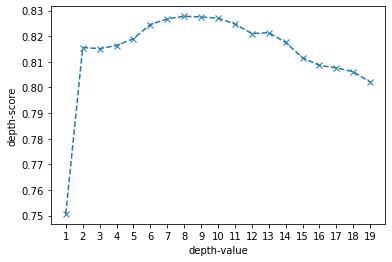

Best maximum depth values is :  8


In [34]:
best_depth=depth_list[depth_scores.index(max(depth_scores))]
plt.plot(depth_list,depth_scores,linestyle='dashed',marker='x',markerfacecolor='red')
plt.xlabel('depth-value')
plt.ylabel('depth-score')
plt.xticks(range(1,20))
plt.show()
print('Best maximum depth values is : ',best_depth)

### Visualizing Decision Tree

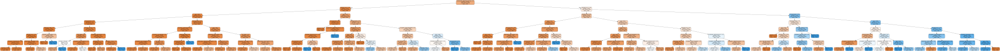

In [67]:
dot_data = tree.export_graphviz(model, out_file=None, label='all', impurity=False, proportion=True, 
                               feature_names=features, class_names=['<50K', '>50K'],
                               filled=True, rounded=True)
graph = graphviz.Source(dot_data)
graph

### Prunning : Cost complexity pruning

In [35]:
path = model.cost_complexity_pruning_path(x_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

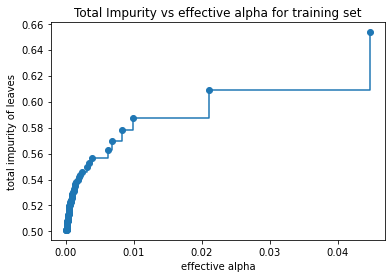

In [36]:
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker='o', drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

In [46]:
clfs = []
clfs_score=[]
for ccp_alpha in ccp_alphas:
    model2 = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    model2.fit(x_train, y_train)
    scores=model2.score(x_train,y_train)
    clfs_score.append(scores.mean())
    clfs.append(model2)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
      clfs[-1].tree_.node_count, ccp_alphas[-1]))

Number of nodes in the last tree is: 1 with ccp_alpha: 0.15689782553170328


DecisionTreeClassifier(random_state=0)


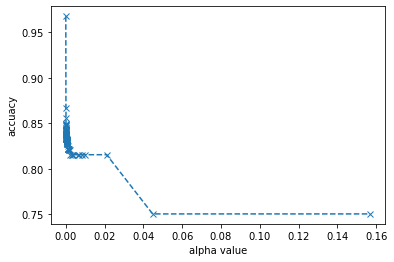

Best maximum alpha values is :  0.0  with accuracy:  0.9674651856763926


In [64]:
best_alpha_index=clfs_score.index(max(clfs_score))
best_alpha_classifier=clfs[best_alpha_index]
print(best_alpha_classifier)
plt.plot(ccp_alphas,clfs_score,linestyle='dashed',marker='x',markerfacecolor='red')
plt.xlabel('alpha value')
plt.ylabel('accuacy')
#plt.xticks(range(1,20))
plt.show()
print('Best alpha values is : ',ccp_alphas[best_alpha_index],' for accuracy: ',clfs_score[best_alpha_index])
#print(len(clfs))


## Final Decision Tree (After pruning)

In [65]:
dot_data = tree.export_graphviz(best_alpha_classifier, out_file=None, label='all', impurity=False, proportion=True, 
                               feature_names=features, class_names=['<50K', '>50K'],
                               filled=True, rounded=True)
graph = graphviz.Source(dot_data)
graph